In [1]:
# %matplotlib widget
%load_ext autoreload
%autoreload 2
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import rainbow
import numpy as np
from scipy.integrate import odeint
from scipy.io import loadmat
from sklearn import linear_model
from sklearn.neural_network import MLPRegressor
import statistics
import tensorflow as tf
import tensorflow_probability as tfp
tfd = tfp.distributions
tfpl = tfp.layers
tfk = tf.keras
tfkl = tf.keras.layers
from layers import *
import statsmodels.api as sm
import statsmodels.formula.api as smf

from models import LSTMEmbedding, LSTMVAEEmbedding #,MLPEmbedding, ETDEmbedding, AMIEmbedding, TICAEmbedding
from regularizers import FNN
import seaborn as sns
sns.set_style("white")
# %matplotlib notebook
# import mpld3
# mpld3.enable_notebook()

In [2]:
def lorenz(x, t, robustness_to_scale=1):
    return [
        robustness_to_scale*10 * (x[1] - x[0]/robustness_to_scale),
        x[0]/robustness_to_scale * (28 - x[2]) - x[1],
        x[0]/robustness_to_scale * x[1] - 8 / 3 * x[2],
    ]

In [3]:
dt = 0.004 #dictated by mutual information criteria
num_steps =500
t_train = np.arange(0, num_steps, dt)
x0 = [-8, 8, 27]
x_train = odeint(lorenz, x0, t_train)
x_dot_train_measured = np.array(
    [lorenz(x_train[i], 0) for i in range(t_train.size)]
)

adjustement=10
dt_adjusted=dt*adjustement
obs = x_train[::adjustement,:]
obs_x = obs[:,0]
obs_y = obs[:,1]
obs_z = obs[:,2]

## FNN network from Gilpin

In [4]:
%%time
# LSTM
# try 3 and 4 and 5 latent and multiple lambdas 0, 0.01, 0.1
tf.keras.backend.clear_session()
n_latent = 10

lstm_model = LSTMEmbedding(n_latent, 
                     time_window=10, 
                     tau=0,
                     random_state=0,
                     latent_regularizer=FNN(strength=0.04)
                     )
train_steps= 200
coords_lstm = lstm_model.fit_transform(obs_x, train_steps=train_steps, verbose = 0.1)
print("LSTM complete")



Epoch 1/200


KeyboardInterrupt: 

Text(0, 0.5, '$l_1(t)$')

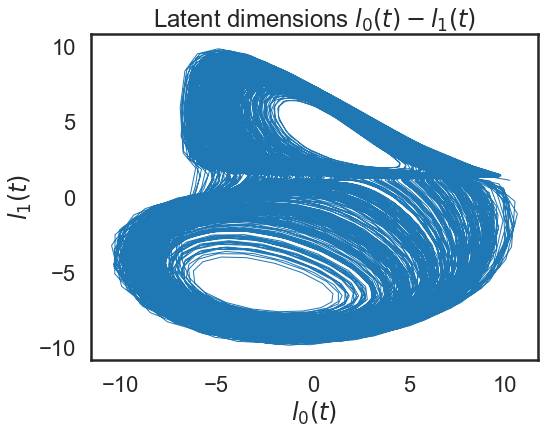

In [35]:
sns.set_context("poster")
plt.figure(figsize=(8,6))
delay=int(0.08/dt_adjusted)
plt.plot(coords_lstm[:,0], coords_lstm[:,1],  linewidth=1)
plt.title("Latent dimensions $l_0(t)-l_1(t)$")
plt.xlabel("$l_0(t)$")
plt.ylabel("$l_1(t)$")

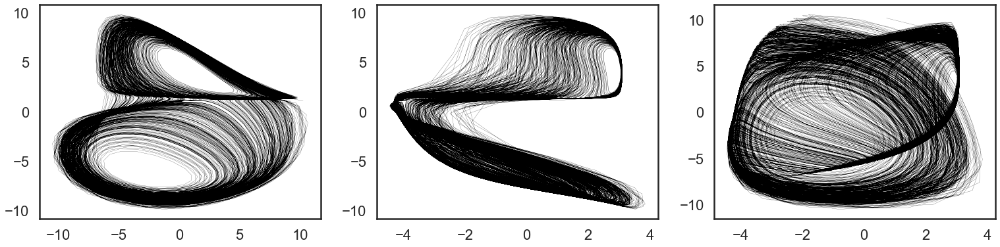

In [36]:
sns.set_context("poster")
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(26,6))
ax[0].plot(coords_lstm[:,0], coords_lstm[:,1], 'k', linewidth=.2)
ax[1].plot(coords_lstm[:,2], coords_lstm[:,1], 'k', linewidth=.2)
ax[2].plot(coords_lstm[:,2], coords_lstm[:,0], 'k', linewidth=.2)

Text(0, 0.5, 'z')

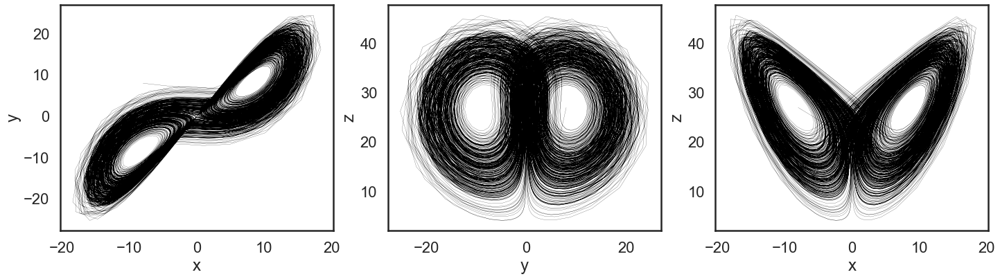

In [6]:
# %% Plots of original space
sns.set_context("poster")
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(26,6))
ax[0].plot(obs_x, obs_y, 'k', linewidth=.2)
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[1].plot(obs_y, obs_z, 'k', linewidth=.2)
ax[1].set_xlabel('y')
ax[1].set_ylabel('z')
ax[2].plot(obs_x, obs_z, 'k', linewidth=.2)
ax[2].set_xlabel('x')
ax[2].set_ylabel('z')

0.904516102253664
[[ 0.7677931  -0.07787191  0.9199751   0.07254075  1.44945    -0.06142719]
 [ 1.0178038  -0.03469525  1.1407837  -1.3820932   1.4878755  -1.540865  ]
 [ 0.22426441  0.19141883 -0.81691813 -3.463388    0.13443531  2.2329538 ]]


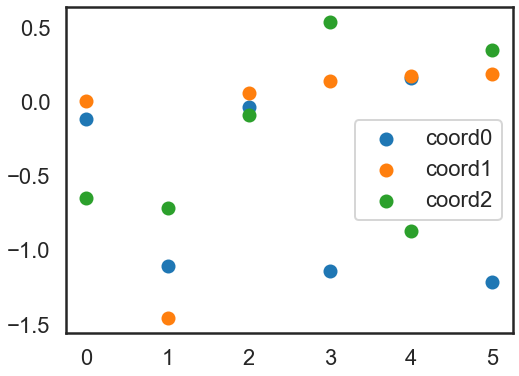

In [52]:
#%% Linearly decode embeddings into original space
reg = linear_model.LinearRegression()
# reg.fit(coords_lstm, obs[10:])
target= np.array([obs_x ,obs_y, obs_z]).T
reg.fit(coords_lstm, target[10:])
x_pred = reg.predict(coords_lstm)

print(reg.score(coords_lstm, target[10:]))
print(reg.coef_)
sns.set_context("poster")
plt.figure(figsize=(8,6))
plt.scatter(range(len(reg.coef_[0])), np.log10(np.abs(reg.coef_[0])), label='coord0')
plt.scatter(range(len(reg.coef_[0])), np.log10(np.abs(reg.coef_[1])), label='coord1')
plt.scatter(range(len(reg.coef_[0])), np.log10(np.abs(reg.coef_[2])), label='coord2')
plt.legend()




In [48]:
results = sm.OLS(target[10:,1].T, coords_lstm).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.756
Model:                            OLS   Adj. R-squared (uncentered):              0.756
Method:                 Least Squares   F-statistic:                              6446.
Date:                Wed, 07 Apr 2021   Prob (F-statistic):                        0.00
Time:                        18:23:48   Log-Likelihood:                         -36390.
No. Observations:               12490   AIC:                                  7.279e+04
Df Residuals:                   12484   BIC:                                  7.284e+04
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.7592      0.014     52.438      0.000       0.731       0.788
x2            -0.2980      0.020    -14.625      0.000      -0.338      -0.258
x3             0.9626      0.012     82.887      0.000       0.940       0.985
x4            -0.4230      0.022    -19.311      0.000      -0.466      -0.380
x5             1.2287      0.011    110.180      0.000       1.207       1.251
x6            -0.7934      0.017    -46.932      0.000      -0.827      -0.760
==============================================================================
Omnibus:                      403.406   Durbin-Watson:                   0.265
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              421.491
Skew:                           0.430   Prob(JB):                     2.98e-92
Kurtosis:                       2.732   Cond. No.                         5.62
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

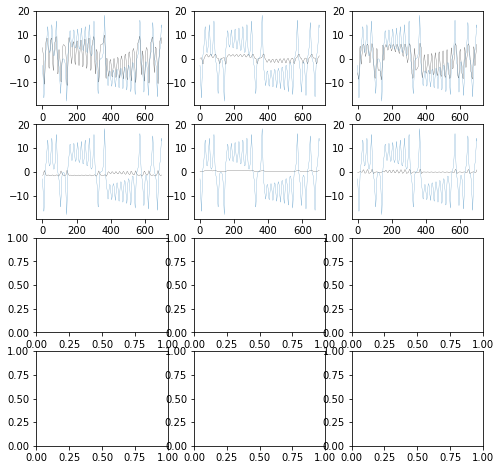

In [20]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(8,8))
for i, coef in enumerate(reg.coef_[0]):
#     print(i%3, int(i/4))
    ax[int(i/3), i%3].plot((coef* coords_lstm[:,i])[100:800], 'k', linewidth=.2)
    ax[int(i/3), i%3].plot((obs_x )[10:][100:800],  linewidth=.2)

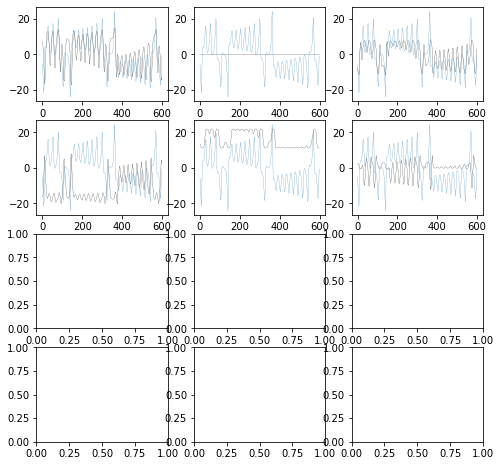

In [21]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(8,8))
for i, coef in enumerate(reg.coef_[1]):
#     print(i%3, int(i/4))
    ax[int(i/3), i%3].plot((coef* coords_lstm[:,i])[100:700], 'k', linewidth=.2)
    ax[int(i/3), i%3].plot((obs_y[10:])[100:700],  linewidth=.2)

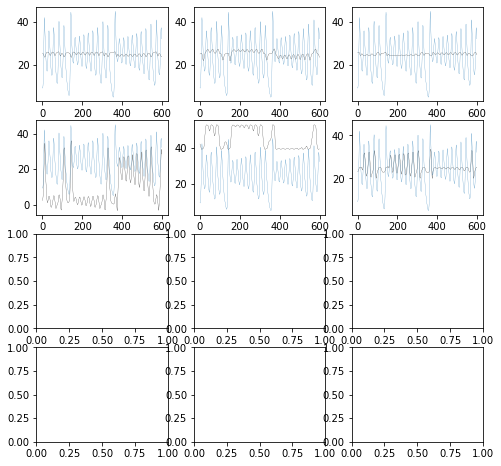

In [22]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(8,8))
for i, coef in enumerate(reg.coef_[2]):
#     print(i%3, int(i/4))
    ax[int(i/3), i%3].plot((coef* coords_lstm[:,i])[100:700] +25, 'k', linewidth=.2)
    ax[int(i/3), i%3].plot((obs[10:,2])[100:700],  linewidth=.2)

Text(0, 0.5, 'z')

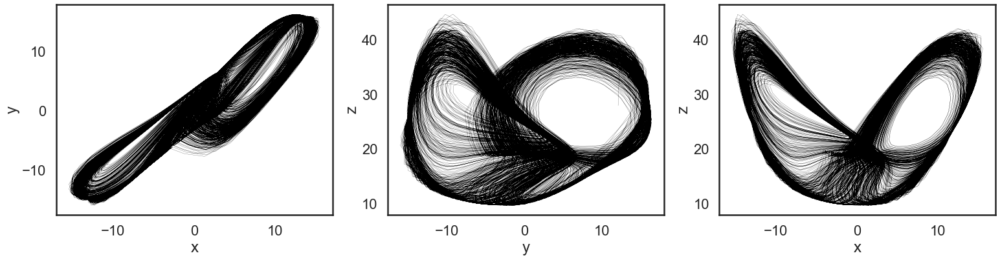

In [53]:
#%% Plots of decoded space
sns.set_context("poster")
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(26,6))
ax[0].plot(x_pred[:,0], x_pred[:,1], 'k', linewidth=.2)
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[1].plot(x_pred[:,1], x_pred[:,2], 'k', linewidth=.2)
ax[1].set_xlabel('y')
ax[1].set_ylabel('z')
ax[2].plot(x_pred[:,0], x_pred[:,2], 'k', linewidth=.2)
ax[2].set_xlabel('x')
ax[2].set_ylabel('z')

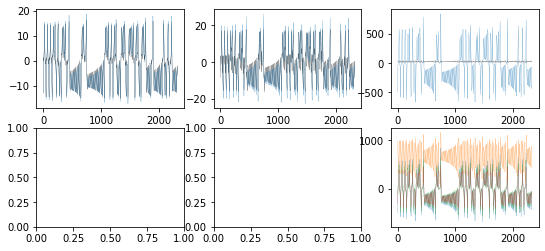

In [24]:
#%% Further plots of decoded space
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(9,4))
# ax[0].plot(x_pred[:,0], 'k', linewidth=.2)
# ax[0].plot(obs[10:,0],  linewidth=.2)
ax[0,0].plot(x_pred[:,0][1000:6000], 'k', linewidth=.2)
ax[0,0].plot(obs[10:,0][1000:6000],  linewidth=.2)
ax[0,1].plot(x_pred[:,1][1000:6000], 'k', linewidth=.2)
ax[0,1].plot(obs[10:,1][1000:6000],  linewidth=.2)
ax[0,2].plot(x_pred[:,2][1000:6000], 'k', linewidth=.2)
ax[0,2].plot((obs[10:,2]*obs[10:,0])[1000:6000],  linewidth=.2)
ax[1,2].plot((obs[10:,2]*obs[10:,0])[1000:6000],  linewidth=.2)
ax[1,2].plot((obs[10:,2]*25)[1000:6000],  linewidth=.2)
ax[1,2].plot((obs[10:,1]*25)[1000:6000],  linewidth=.2)
ax[1,2].plot((obs[10:,0]*25)[1000:6000],  linewidth=.2)


In [ ]:
plt.figure()
plt.plot(x_pred[:,0], 'k', linewidth=.2)

plt.plot(obs[10:,1]*obs[10:,0],  linewidth=.2)
mpld3.display()

In [88]:
#%% Active dimensionality
var_d = np.var(coords_lstm, axis=0)
var_d_normalised = np.sort(var_d/ np.max(var_d))[::-1]
var_n = var_d_normalised
plt.figure()
plt.scatter(range(len(var_n)), 50 + np.log(var_n))
plt.plot(50 + np.log(var_n))



Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

LSTM complete
LSTM complete
LSTM complete
LSTM complete
LSTM complete
LSTM complete


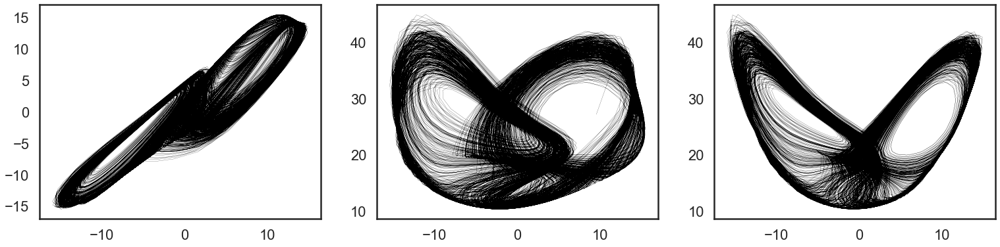

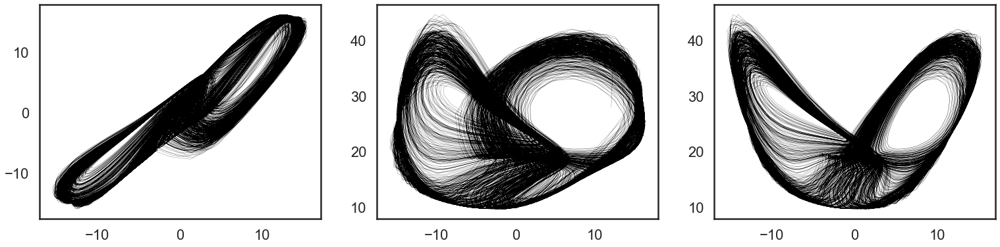

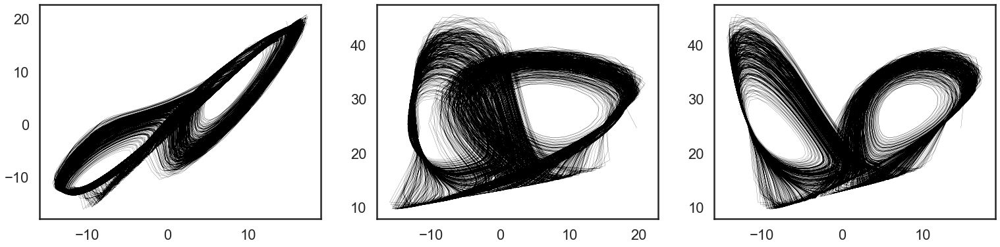

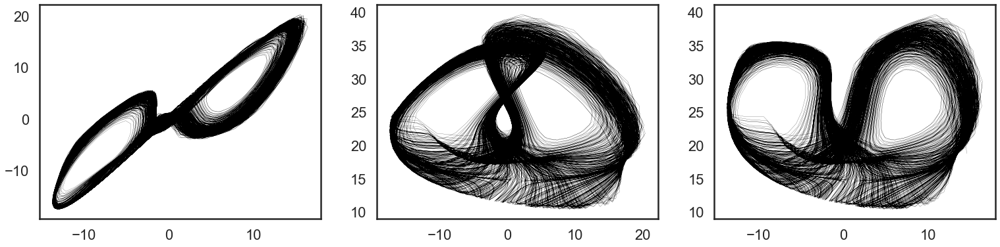

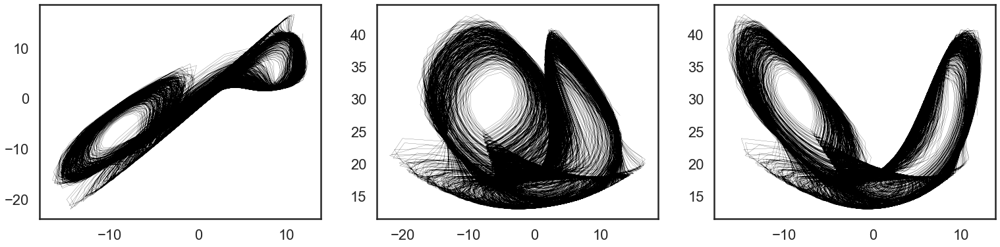

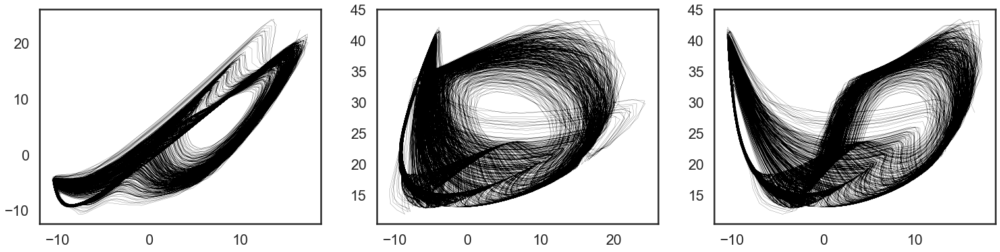

In [54]:
# Dimensionality
loss_list = []
latent_list = []
var_list = []
lambda_list= [0]+ np.geomspace(0.01, 10,num=6)
for strength in lambda_list:
    # LSTM
    tf.keras.backend.clear_session()
    lstm_model = LSTMEmbedding(6, 
                        time_window=10, 
                        latent_regularizer=FNN(strength=strength),
                        random_state=0
                        )
    coords_lstm = lstm_model.fit_transform(obs_x,verbose =0)
    print("LSTM complete")
    loss_list = loss_list + [lstm_model.train_history.history['loss']]
    latent_list = latent_list + [lstm_model.train_history.history['latent_regularizer_normalized']]
    var_d = np.var(coords_lstm, axis=0)
    var_d_normalised = np.sort(var_d/ np.max(var_d))[::-1]
    var_list = var_list + [var_d_normalised]
    
    # plots without linear projection
    if False:
        sns.set_context("poster")
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(26,6))
        ax[0].plot(coords_lstm[:,0], coords_lstm[:,1], 'k', linewidth=.2)
        ax[1].plot(coords_lstm[:,2], coords_lstm[:,1], 'k', linewidth=.2)
        ax[2].plot(coords_lstm[:,2], coords_lstm[:,0], 'k', linewidth=.2)

    # reconstruction with linear projection
    if True:
        reg = linear_model.LinearRegression()
        target= np.array([obs_x ,obs_y, obs_z]).T
        reg.fit(coords_lstm, target[10:])
        x_pred = reg.predict(coords_lstm)
        sns.set_context("poster")
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(26,6))
        ax[0].plot(x_pred[:,0], x_pred[:,1], 'k', linewidth=.2)
        ax[1].plot(x_pred[:,1], x_pred[:,2], 'k', linewidth=.2)
        ax[2].plot(x_pred[:,0], x_pred[:,2], 'k', linewidth=.2)
    

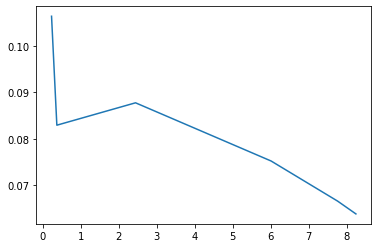

In [15]:
plt.figure()
plt.plot( np.array(latent_list)[:,-1], np.array(loss_list)[:,-1] )


In [16]:
lambda_list

array([ 0.01      ,  0.03981072,  0.15848932,  0.63095734,  2.51188643,
       10.        ])

In [135]:
plt.figure()
for var_n in var_list:
    plt.scatter(range(len(var_n)), 50 + np.log(var_n))
    plt.plot(50 + np.log(var_n))



Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## PCA